NAMAN RAJENDRA JOSHI

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from imblearn.over_sampling import SMOTE
from collections import Counter
import random
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.neighbors import NearestCentroid
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay
import pickle
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split


In [85]:
data = pd.read_csv("starcraft_player_data.csv")
data.head()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.0,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001193,5,0.0,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.0,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.0,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.0,0.000019


In [9]:
data.shape

(3395, 20)

In [8]:
data.columns

Index(['GameID', 'LeagueIndex', 'Age', 'HoursPerWeek', 'TotalHours', 'APM',
       'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks',
       'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency',
       'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilitiesUsed'],
      dtype='object')

Lets first try to visualize the data

Objectives

1) To understand the dataset 
2) To understand which variables are useful for classification 
3) To draw different types of plots to understand the dataset.

In [86]:
data = data.drop('GameID', axis=1)

In [87]:
X = data.drop('LeagueIndex', axis=1)  # Drop the column 'y' to get the features
y = data['LeagueIndex']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Visualization and Analysis will only be done on the train data

In [88]:
print(X_train.isnull().sum())  # To check if there are any null values

Age                     0
HoursPerWeek            0
TotalHours              0
APM                     0
SelectByHotkeys         0
AssignToHotkeys         0
UniqueHotkeys           0
MinimapAttacks          0
MinimapRightClicks      0
NumberOfPACs            0
GapBetweenPACs          0
ActionLatency           0
ActionsInPAC            0
TotalMapExplored        0
WorkersMade             0
UniqueUnitsMade         0
ComplexUnitsMade        0
ComplexAbilitiesUsed    0
dtype: int64


There are no null values

In [89]:
y_train.value_counts()

5    648
4    644
6    504
3    441
2    267
1    136
8     45
7     31
Name: LeagueIndex, dtype: int64

These are the number of players in each league. We can clearly see that 7(Grandmaster) and 8(Professional) leagues having very less data. One of the reasons can be that number of players in these leagues are capped to a certain number and it is also possible that requirements to enter these leagues might be higher which can lead to less players being able to enter these leagues

When it comes to 1 and 2, these leagues also have less number because when a player is in intial stages of the game, they are less likely to record their statistics 

We can clearly see that the dataset is clearly imbalanced

In [90]:
import warnings    # to ignore the warning messages
warnings.filterwarnings('ignore')


In [116]:
train_data = pd.concat([X_train, y_train], axis=1)

In [93]:
plt.close()
sns.set_style('whitegrid')
train_data = pd.concat([X_train, y_train], axis=1)
z = sns.pairplot(train_data, height=6)
z.fig.suptitle('Pair plot of all features', fontsize=25)
plt.show()


If we try to maximize and see the above plot, we can see that APM and Action Latency are one of the most important features in this data as there is a quite prominent relation between these features and the target variable League index.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


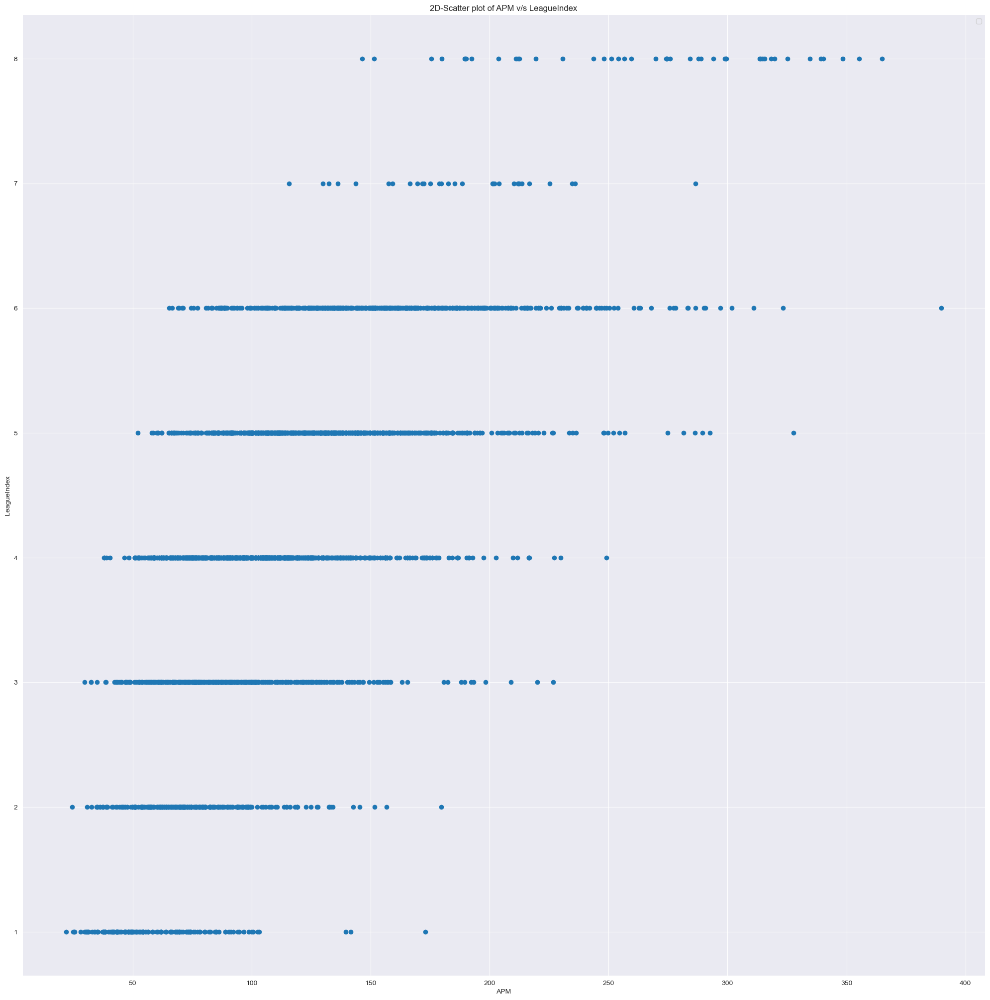

In [17]:
sns.set_style('darkgrid')
sns.FacetGrid(train_data, height=20, aspect=1) \
    .map(plt.scatter,'APM','LeagueIndex')

plt.ylabel('LeagueIndex')
plt.xlabel('APM')
plt.legend()
plt.title('2D-Scatter plot of APM v/s LeagueIndex')
plt.show()

We can see that people with lower leagues have less APM as compared to advanced league players

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


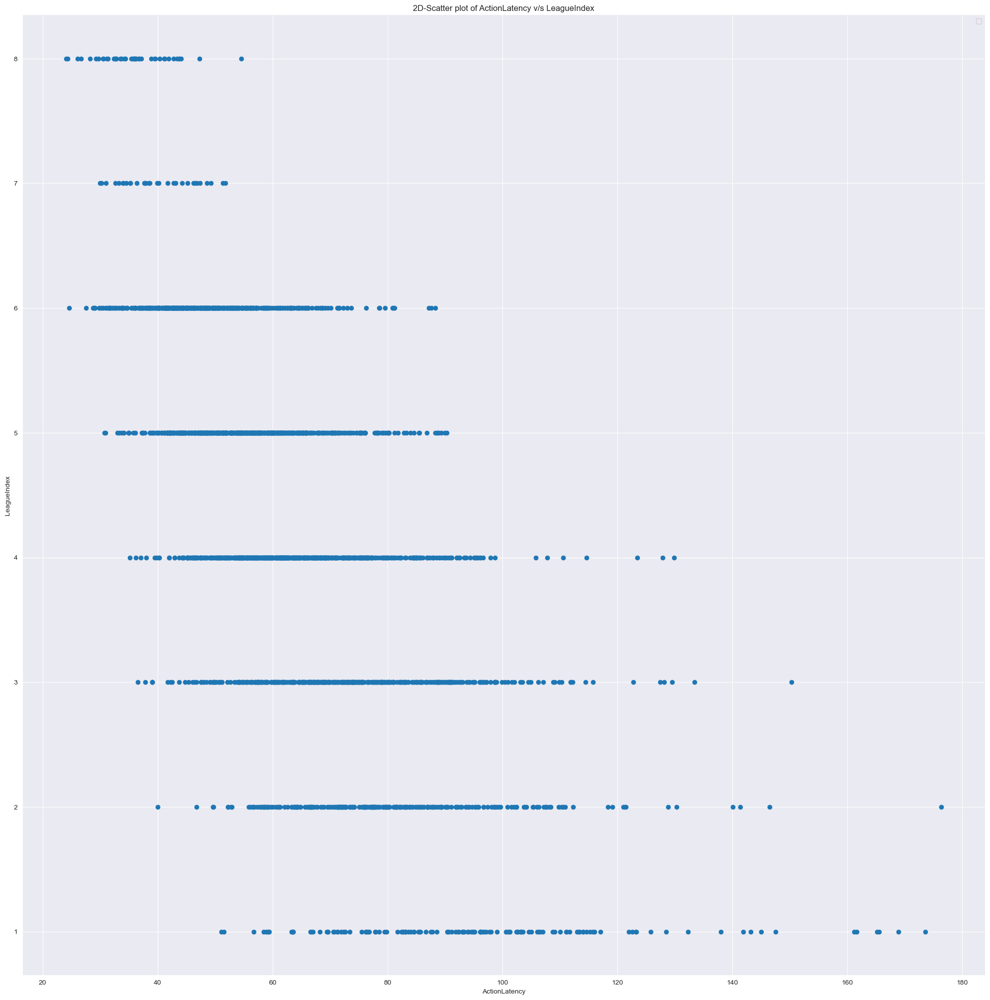

In [19]:
sns.set_style('darkgrid')
sns.FacetGrid(train_data, height=20, aspect=1) \
    .map(plt.scatter,'ActionLatency','LeagueIndex')

plt.ylabel('LeagueIndex')
plt.xlabel('ActionLatency')
plt.legend()
plt.title('2D-Scatter plot of ActionLatency v/s LeagueIndex')
plt.show()

We can see that people with lower leagues have high Action Latency as compared to advanced league players which is quite natural

Lets now check the correlation

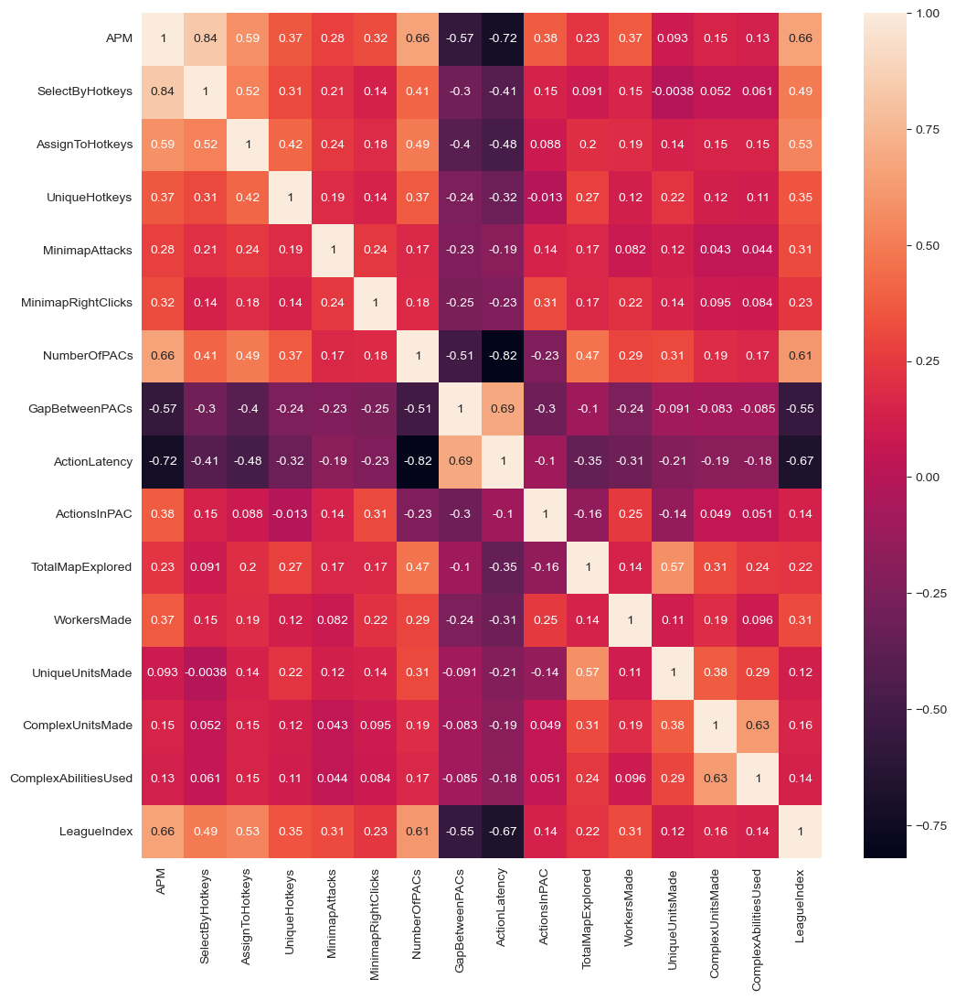

In [94]:
corr_matrix = train_data.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(corr_matrix, annot=True)
plt.show()


This matrix confirms the observation that APM and ActionLatency (Have high correlation with LeagueIndex) contains the maximum information

We can also see multi-collinearity in the data. Example, NumberofPACs and ActionLatency are highly correlated. We can remove NumberofPACs

Outlier Replacement

In [95]:
print(X_train.isnull().sum())  # To check if there are any null values


Age                     0
HoursPerWeek            0
TotalHours              0
APM                     0
SelectByHotkeys         0
AssignToHotkeys         0
UniqueHotkeys           0
MinimapAttacks          0
MinimapRightClicks      0
NumberOfPACs            0
GapBetweenPACs          0
ActionLatency           0
ActionsInPAC            0
TotalMapExplored        0
WorkersMade             0
UniqueUnitsMade         0
ComplexUnitsMade        0
ComplexAbilitiesUsed    0
dtype: int64


In [96]:
train_data

,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed,LeagueIndex
765,26,2,100,48.4494,0.000709,0.000228,3,0.000060,0.000048,0.002775,52.9913,84.6061,3.1991,26,0.000553,7,0.000000,0.000048,1
2073,19,14,400,98.2944,0.002036,0.000479,10,0.000067,0.000143,0.003751,29.6719,54.5830,4.3318,48,0.000807,7,0.000000,0.000000,3
2164,26,6,288,119.5176,0.002864,0.000453,10,0.000344,0.000172,0.006054,31.8261,43.1317,3.1557,31,0.000897,7,0.000000,0.000000,6
3235,25,8,420,51.2376,0.000000,0.000000,0,0.000000,0.000461,0.002643,80.6734,78.4966,3.7416,31,0.001127,7,0.000044,0.000346,2
2383,25,16,100,161.4504,0.003442,0.000378,4,0.000083,0.001089,0.004724,31.6556,41.6562,5.4668,27,0.001153,6,0.000000,0.000000,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,18,28,1300,203.2734,0.017934,0.000668,6,0.001244,0.000658,0.003496,34.2301,54.7765,5.8353,27,0.000792,5,0.000000,0.000000,5
1130,32,28,110,58.8558,0.001364,0.000307,1,0.000013,0.000013,0.002406,50.1229,88.0222,4.0389,15,0.000441,3,0.000000,0.000000,2
1294,19,8,230,56.6370,0.001045,0.000326,1,0.000000,0.000034,0.003035,47.3309,81.4074,3.3000,17,0.000809,8,0.000056,0.000045,2
860,20,20,400,119.1078,0.002857,0.000047,3,0.000012,0.000652,0.003805,25.8125,56.3614,5.0966,23,0.000427,5,0.000000,0.000000,3


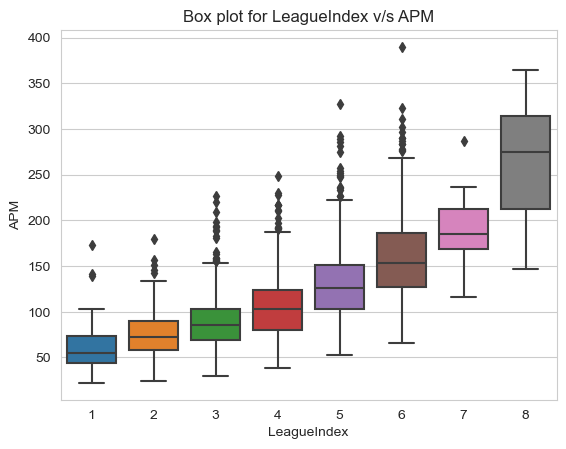

In [117]:
sns.boxplot(x='LeagueIndex', y='APM', data=train_data)
plt.ylabel('APM')
plt.xlabel('LeagueIndex')
plt.title("Box plot for LeagueIndex v/s APM")
plt.show()


In [107]:
def cap_outliers(train_data, column):
    percentiles_by_target = train_data.groupby('LeagueIndex')[column].apply(
        lambda x: np.percentile(x, [25, 75]))
    grouped_data_train = train_data.groupby('LeagueIndex')
    dfs = []
    for i in range(1,len(percentiles_by_target)+1):

        q1, q3 = percentiles_by_target[i]
        iqr = q3 - q1
        lower = (q1 - (1.5*iqr))
        upper = (q3 + (1.5*iqr))
        print("lower bound",lower)
        print("upper bound",upper)
        specific_group_train = grouped_data_train.get_group(i)
        # Cap the outliers
        specific_group_train[column] = np.where(specific_group_train[column]
                              < lower, lower, specific_group_train[column])
        specific_group_train[column] = np.where(specific_group_train[column] > upper, upper, specific_group_train[column])
        dfs.append(specific_group_train)
    new_df = pd.concat(dfs)

    return new_df

In [118]:
numeric_columns = ['APM', 'SelectByHotkeys',
                   'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks', 'MinimapRightClicks',
                   'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency', 'ActionsInPAC',
                   'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade', 'ComplexUnitsMade',
                   'ComplexAbilitiesUsed']

for col in numeric_columns:
    train_data=cap_outliers(train_data, col)

lower bound -1.7087250000000083
upper bound 118.42507499999999
lower bound 11.202300000000001
upper bound 136.7895
lower bound 18.300599999999996
upper bound 153.8814
lower bound 16.048574999999985
upper bound 187.561575
lower bound 29.737200000000016
upper bound 224.688
lower bound 37.549350000000004
upper bound 275.33295
lower bound 102.21629999999999
upper bound 277.9635
lower bound 60.38099999999994
upper bound 466.02420000000006
lower bound -0.0013757523374999998
upper bound 0.0030141751624999996
lower bound -0.0012556595999999999
upper bound 0.0037751751999999996
lower bound -0.0015836596999999997
upper bound 0.0050021562999999995
lower bound -0.0024512944500000005
upper bound 0.00755372015
lower bound -0.0039100599125
upper bound 0.012091266187499998
lower bound -0.006313724837499999
upper bound 0.0186953836625
lower bound -0.0026992652000000002
upper bound 0.0207363708
lower bound -0.006819403949999999
upper bound 0.04943726445
lower bound -0.0001641000007510421
upper bound 0.0

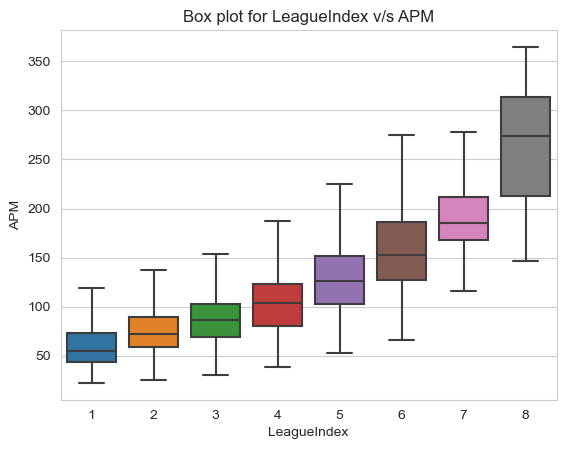

In [119]:
sns.boxplot(x='LeagueIndex', y='APM', data=train_data)
plt.ylabel('APM')
plt.xlabel('LeagueIndex')
plt.title("Box plot for LeagueIndex v/s APM")
plt.show()


Similarly we can update other outliers of other features

[[<AxesSubplot: title={'center': 'APM'}>
  <AxesSubplot: title={'center': 'SelectByHotkeys'}>
  <AxesSubplot: title={'center': 'AssignToHotkeys'}>
  <AxesSubplot: title={'center': 'UniqueHotkeys'}>]
 [<AxesSubplot: title={'center': 'MinimapAttacks'}>
  <AxesSubplot: title={'center': 'MinimapRightClicks'}>
  <AxesSubplot: title={'center': 'NumberOfPACs'}>
  <AxesSubplot: title={'center': 'GapBetweenPACs'}>]
 [<AxesSubplot: title={'center': 'ActionLatency'}>
  <AxesSubplot: title={'center': 'ActionsInPAC'}>
  <AxesSubplot: title={'center': 'TotalMapExplored'}>
  <AxesSubplot: title={'center': 'WorkersMade'}>]
 [<AxesSubplot: title={'center': 'UniqueUnitsMade'}>
  <AxesSubplot: title={'center': 'ComplexUnitsMade'}>
  <AxesSubplot: title={'center': 'ComplexAbilitiesUsed'}>
  <AxesSubplot: title={'center': 'LeagueIndex'}>]]


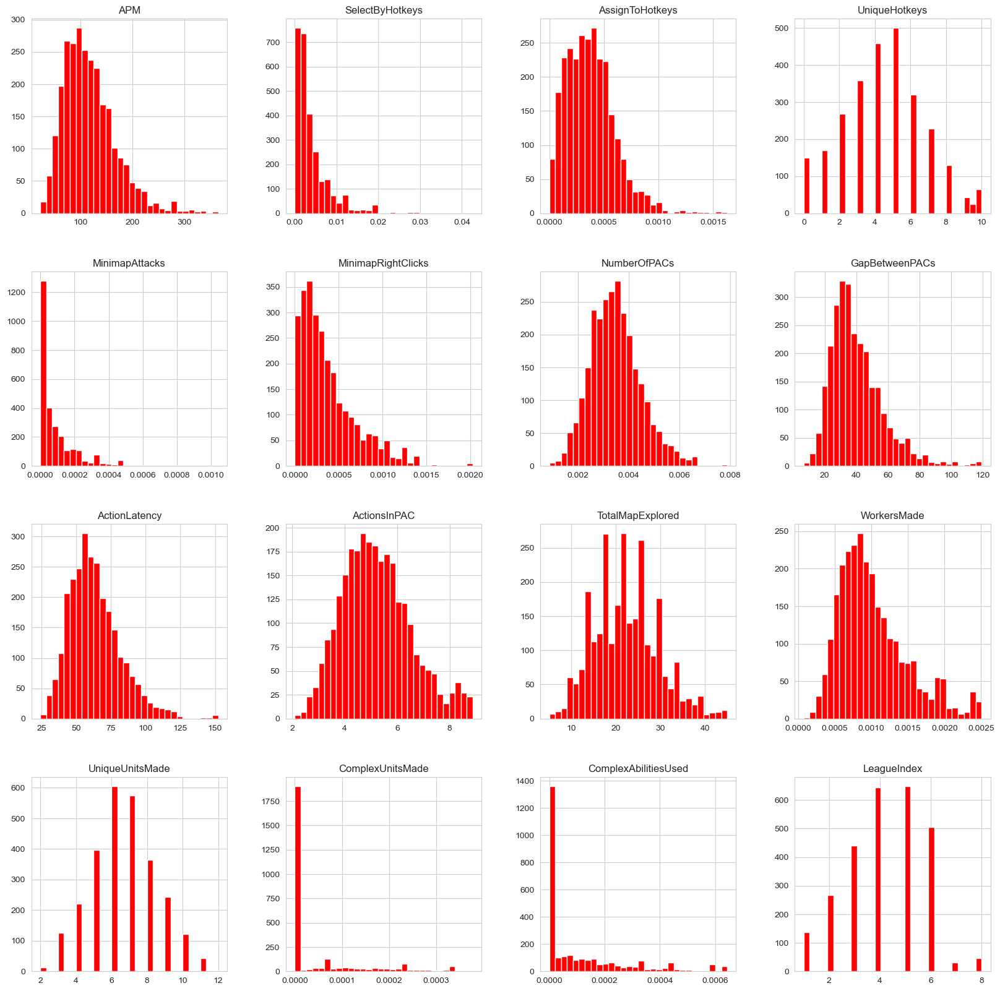

In [120]:
#Perform Data Analysis
print(train_data.hist(bins=30, figsize=(20, 20), color='r'))
plt.show()


From the above histograms, we can see the distributions of the different features. We can observe that most of the distribtution follow Normal Distribution and some of them follow Pareto Distribution. So we can perform standard scaler on this data.

In [121]:
X_train = train_data.drop('LeagueIndex', axis=1)  # Drop the column 'y' to get the features
y_train = train_data['LeagueIndex']

In [125]:
# Create an instance of StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train[numeric_columns])

# Transform the test data using the scaler fitted on the training data
X_test_scaled = scaler.transform(X_test[numeric_columns])


Applying ML Models

In [157]:
def performance_metrics(Y_train, class_assignments):
    # compute accuracy
    accuracy = accuracy_score(Y_train, class_assignments)
    print("Accuracy:", accuracy)

    # compute f1-score
    f1 = f1_score(Y_train, class_assignments, average='weighted')
    print("F1-score:", f1)

    # compute confusion matrix
    cm = confusion_matrix(Y_train, class_assignments)
    cm_display = ConfusionMatrixDisplay(cm).plot()
    print("Confusion matrix:\n", cm_display)


Random Forest

In [151]:
def tune_random(X_tr, y_tr):

    list_of_paramters = {
        'n_estimators': [50, 100, 200, 300],
        'max_depth': [5, 10, 20, 15],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Create a random forest classifier object
    clf = RandomForestClassifier(random_state=42, class_weight='balanced')

    search_grid_n = GridSearchCV(
        clf,
        param_grid=list_of_paramters,
        cv=cv,
        scoring='f1_micro',
        n_jobs=-1
    )

    search_grid_n.fit(X_tr, y_tr)

    best_p = search_grid_n.best_params_
    b_score = search_grid_n.best_score_

    print(f"Best hyperparameters are: {best_p}")
    print(f"Best F1-score is: {b_score}")


In [149]:
def random_f(X_tr, y_tr, X_te, Y_te, max_depth, max_features, min_samples_leaf, min_samples_split, n_estimators):
    rf = RandomForestClassifier(max_depth= max_depth, max_features= max_features, min_samples_leaf= min_samples_leaf, min_samples_split= min_samples_split, n_estimators= n_estimators)

    # Train the classifier on the training data
    rf.fit(X_tr, y_tr)
    print("Train Data")
    # make predictions on the test data
    with open('model.pkl', 'wb') as file:
        pickle.dump(rf, file)
    y_pred = rf.predict(X_tr)
    #print(y_pred.shape)
    performance_metrics(y_tr, y_pred)
    print("test data")
    y_pred_test = rf.predict(X_te)
    performance_metrics(Y_te, y_pred_test)

In [158]:
tune_random(X_train_scaled, y_train)

Best hyperparameters are: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best F1-score is: 0.5080990683566244


Train Data
Accuracy: 0.8232695139911634
F1-score: 0.8224184088381484
Confusion matrix:
test data
Accuracy: 0.3711340206185567
F1-score: 0.36526763437859217
Confusion matrix:


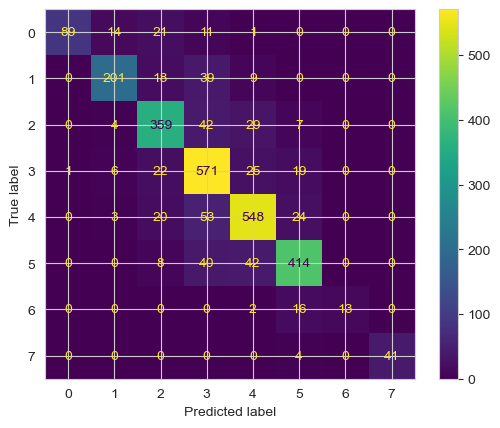

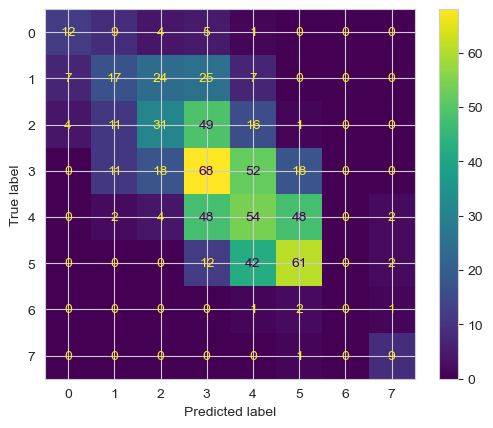

In [161]:
random_f(X_train_scaled, y_train,X_test_scaled,y_test,10,'sqrt',1,5,200)

Logistic Regression

In [162]:
def tune_logistic(X_tr, y_tr,X_te,Y_te):

    list_of_paramters = {
        'penalty': ['l2','l1'],
        'C': [0.01, 0.1, 1.0,10],
        'solver': ['saga', 'liblinear']
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Create a random forest classifier object
    clf = LogisticRegression()
    search_grid_n = GridSearchCV(
        clf,
        param_grid=list_of_paramters,
        cv=cv,
        scoring='f1_weighted',
        n_jobs=-1
    )

    search_grid_n.fit(X_tr, y_tr)

    best_p = search_grid_n.best_params_
    b_score = search_grid_n.best_score_
    print(f"Best hyperparameters are: {best_p}")
    print(f"Best F1-score is: {b_score}")
    clf = LogisticRegression(**best_p)
    clf.fit(X_tr, y_tr)
    print("Train Data")
    # make predictions on the test data
    y_pred = clf.predict(X_tr)
    #print(y_pred.shape)
    performance_metrics(y_tr, y_pred)
    print("test data")
    y_pred_test = clf.predict(X_te)
    performance_metrics(np.array(Y_te), y_pred_test)
    return clf

Best hyperparameters are: {'C': 10, 'penalty': 'l1', 'solver': 'saga'}
Best F1-score is: 0.4288753380183727
Train Data
Accuracy: 0.4491899852724595
F1-score: 0.4494305280030575
Confusion matrix:
test data
Accuracy: 0.35198821796759944
F1-score: 0.3444537816015744
Confusion matrix:


LogisticRegression(C=10, penalty='l1', solver='saga')

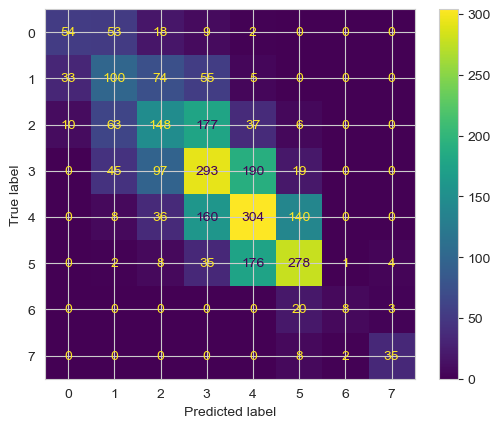

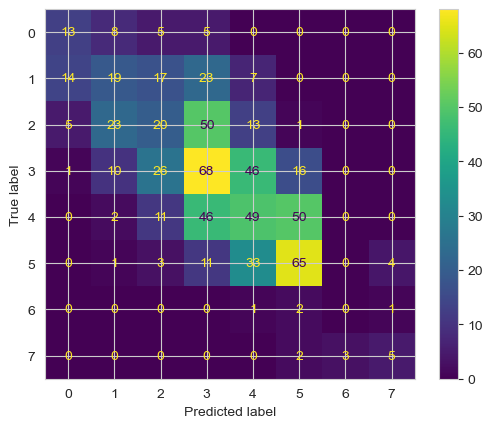

In [163]:
tune_logistic(X_train_scaled, y_train,X_test_scaled,y_test)

MLP

In [164]:
def mlp(X_tr, y_tr, X_te, Y_te):
    # create an MLP object
    mlp = MLPClassifier(hidden_layer_sizes=(
        20, 20, 20), activation='relu', solver='adam', max_iter=300, alpha=0.001)

    # train the MLP on the training data
    mlp.fit(X_tr, y_tr)
    print("Train Data")
    # make predictions on the test data
    y_pred = mlp.predict(X_tr)
    #print(y_pred.shape)
    performance_metrics(y_tr, y_pred)
    print("test data")
    y_pred_test = mlp.predict(X_te)
    performance_metrics(Y_te, y_pred_test)
    # make predictions on the test data
    return mlp


Train Data
Accuracy: 0.5578055964653903
F1-score: 0.5566195056142362
Confusion matrix:
test data
Accuracy: 0.3696612665684831
F1-score: 0.364882285832752
Confusion matrix:


MLPClassifier(alpha=0.001, hidden_layer_sizes=(20, 20, 20), max_iter=300)

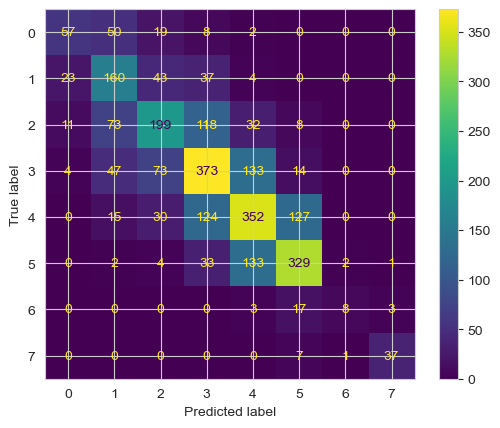

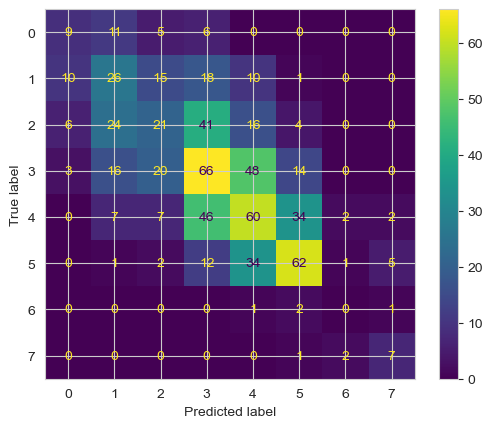

In [165]:
mlp(X_train_scaled, y_train,X_test_scaled,y_test)

We can see that Random Forest is performing well

Hypothetical: after seeing your work, your stakeholders come to you and say that they
can collect more data, but want your guidance before starting. How would you advise
them based on your EDA and model results?

I would say collect more data for minority classes which will help improve class imbalance.

There are two main features that is APM and ActionLatency, so it is important that new data has these values